In [1]:
#usage2
import pandas as pd
import scanpy as sc
import numpy as np
from anndata import AnnData
df = pd.read_csv('/lustre/home/2501111653/DeepRUOTv2_test_data/data/simulation_gene.csv')

# samples: cell_time (cells * 1)
obs = pd.DataFrame(index=df.index)
obs['samples'] = df['samples'].values

# X: expression data(cells * genes)
X = df.drop(columns=['samples']).values

adata = AnnData(X=X, obs=obs)
adata.write_h5ad('data/simulation_gene.h5ad')

/lustre/home/2501111653/miniconda3/envs/DeepRUOTv2/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [4]:
import CytoBridge
#propoess data
adata = CytoBridge.pp.preprocess(adata, time_key = 'samples', dim_reduction = 'none', normalization = False, log1p = False, select_hvg = False)
#train model based on data
adata = CytoBridge.tl.fit(adata, config = 'ruot', device = 'cuda')

Using 'samples' as the time point identifier.
No time mapping provided. Generating automatic mapping.
Automatically generated time mapping: {0.0: 0, 1.0: 1, 2.0: 2, 3.0: 3, 4.0: 4}
Numerical time points stored in `adata.obs['time_point_processed']`.
Preprocessing recipe finished.
Loading built-in config: 'ruot'

--- Starting Stage: Pretrain ---
  Mode: neural_ode, Epochs: 100, Use Score: False

====  Pretrain  ====
  No scheduler configured; learning rate remains constant
  velocity_net     grad=True
  growth_net       grad=True
  score_net        grad=False
  Optimizer parameters:  [torch.Size([400, 3]), torch.Size([400]), torch.Size([400, 400]), torch.Size([400]), torch.Size([2, 400]), torch.Size([2]), torch.Size([400, 3]), torch.Size([400]), torch.Size([400, 400]), torch.Size([400]), torch.Size([1, 400]), torch.Size([1])]

====  Pretrain  ====
  No scheduler configured; learning rate remains constant
  velocity_net     grad=True
  growth_net       grad=True
  score_net        grad=F

Computing UOT plans...:   0%|          | 0/4 [00:00<?, ?it/s]

Final reg = 0.051000000000000004


Computing UOT plans...:  25%|██▌       | 1/4 [00:01<00:05,  1.71s/it]

Elbow chosen reg_m = 1.125336
Time point 0 sub-block 0 (per_time): reg=0.051000000000000004, reg_m=1.1253355826007645
final reg_m 1.1253355826007645
Final reg = 0.051000000000000004


Computing UOT plans...:  50%|█████     | 2/4 [00:03<00:03,  1.83s/it]

Elbow chosen reg_m = 1.359356
Time point 1 sub-block 0 (per_time): reg=0.051000000000000004, reg_m=1.3593563908785256
final reg_m 1.3593563908785256
Final reg = 0.051000000000000004


Computing UOT plans...:  75%|███████▌  | 3/4 [00:05<00:02,  2.07s/it]

Elbow chosen reg_m = 0.931603
Time point 2 sub-block 0 (per_time): reg=0.051000000000000004, reg_m=0.9316027658125524
final reg_m 0.9316027658125524
Final reg = 0.051000000000000004
Elbow chosen reg_m = 6.162311
Time point 3 sub-block 0 (per_time): reg=0.051000000000000004, reg_m=6.1623106765027
final reg_m 6.1623106765027


Flow matching: 100%|██████████| 3000/3000 [00:33<00:00, 88.89it/s]


  Best model (loss=0.7369) saved → /home/sjt/workspace2/CytoBridge_test-main_crufm/results/experiment_simulation/Train_FM/best_model.pth

--- Starting Stage: Finetune ---
  Mode: neural_ode, Epochs: 500, Use Score: True

====  Finetune  ====
  No scheduler configured; learning rate remains constant
  velocity_net     grad=True
  growth_net       grad=True
  score_net        grad=False
  Optimizer parameters:  [torch.Size([400, 3]), torch.Size([400]), torch.Size([400, 400]), torch.Size([400]), torch.Size([2, 400]), torch.Size([2]), torch.Size([400, 3]), torch.Size([400]), torch.Size([400, 400]), torch.Size([400]), torch.Size([1, 400]), torch.Size([1])]

====  Finetune  ====
  No scheduler configured; learning rate remains constant
  velocity_net     grad=True
  growth_net       grad=True
  score_net        grad=False
  Optimizer parameters:  [torch.Size([400, 3]), torch.Size([400]), torch.Size([400, 400]), torch.Size([400]), torch.Size([2, 400]), torch.Size([2]), torch.Size([400, 3]), t

In [ ]:
#usage1
import scanpy as sc
adata = sc.read_h5ad('/data/Weinreb.h5ad')

In [ ]:
#import CytoBridge
adata = CytoBridge.pp.preprocess(adata, time_key = 'Time point', dim_reduction = 'none', normalization = False, log1p = False, select_hvg = False)

Using 'samples' as the time point identifier.
No time mapping provided. Generating automatic mapping.
Automatically generated time mapping: {0: 0, 1: 1, 2: 2}
Numerical time points stored in `adata.obs['time_point_processed']`.
Preprocessing recipe finished.


In [7]:
adata.obs['time_point_processed']

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
49297    2.0
49298    2.0
49299    2.0
49300    2.0
49301    2.0
Name: time_point_processed, Length: 49302, dtype: float64

In [ ]:
adata = CytoBridge.tl.fit(adata, config = 'ruot', device = 'cuda')

Loading built-in config: 'tigon'

--- Starting Stage: Pretrain ---
  Mode: neural_ode, Epochs: 500
Setting up optimizer for new stage with LR: 0.0001
  Stage 'Pretrain', Epoch 1/500, Loss: 126.3309
  Stage 'Pretrain', Epoch 11/500, Loss: 119.6896
  Stage 'Pretrain', Epoch 21/500, Loss: 117.7660
  Stage 'Pretrain', Epoch 31/500, Loss: 110.9258
  Stage 'Pretrain', Epoch 41/500, Loss: 110.3170
  Stage 'Pretrain', Epoch 51/500, Loss: 99.0514
  Stage 'Pretrain', Epoch 61/500, Loss: 88.2038
  Stage 'Pretrain', Epoch 71/500, Loss: 98.3916
  Stage 'Pretrain', Epoch 81/500, Loss: 83.9978
  Stage 'Pretrain', Epoch 91/500, Loss: 83.3161
  Stage 'Pretrain', Epoch 101/500, Loss: 79.2483
  Stage 'Pretrain', Epoch 111/500, Loss: 75.1681
  Stage 'Pretrain', Epoch 121/500, Loss: 87.6143
  Stage 'Pretrain', Epoch 131/500, Loss: 68.3596
  Stage 'Pretrain', Epoch 141/500, Loss: 68.6867
  Stage 'Pretrain', Epoch 151/500, Loss: 71.0844
  Stage 'Pretrain', Epoch 161/500, Loss: 63.8707
  Stage 'Pretrain', Epo

In [ ]:
adata.obsm['X_latent']

array([[-1.21745588, -1.87692152,  1.20554383, ..., -0.14318822,
        -0.78080754, -0.6247842 ],
       [-5.24358014, -1.7611288 ,  1.72936707, ..., -0.2081857 ,
        -0.43517145,  0.26399423],
       [-5.75244736, -1.4193188 ,  2.10216309, ..., -0.16011941,
        -0.13154208,  0.41367607],
       ...,
       [ 0.25035929, -2.77228699, -1.35244077, ..., -0.30663859,
         0.56767764,  0.629165  ],
       [12.6544253 ,  0.75830339,  6.56914994, ...,  0.65489228,
         0.86367503, -0.08910855],
       [-5.76521136, -1.7375523 ,  1.49921873, ..., -0.4063216 ,
         0.20304221, -0.80190196]])

In [ ]:
adata

AnnData object with n_obs × n_vars = 49302 × 2447
    obs: 'Library', 'Cell barcode', 'Time point', 'Starting population', 'Cell type annotation', 'Well', 'SPRING-x', 'SPRING-y', 'clone', 'batch', 'time_point_processed'
    var: 'gene'
    uns: 'dynamic_model'
    obsm: 'X_pca', 'X_umap', 'X_latent', 'velocity_latent', 'growth_rate'
    varm: 'PCs'

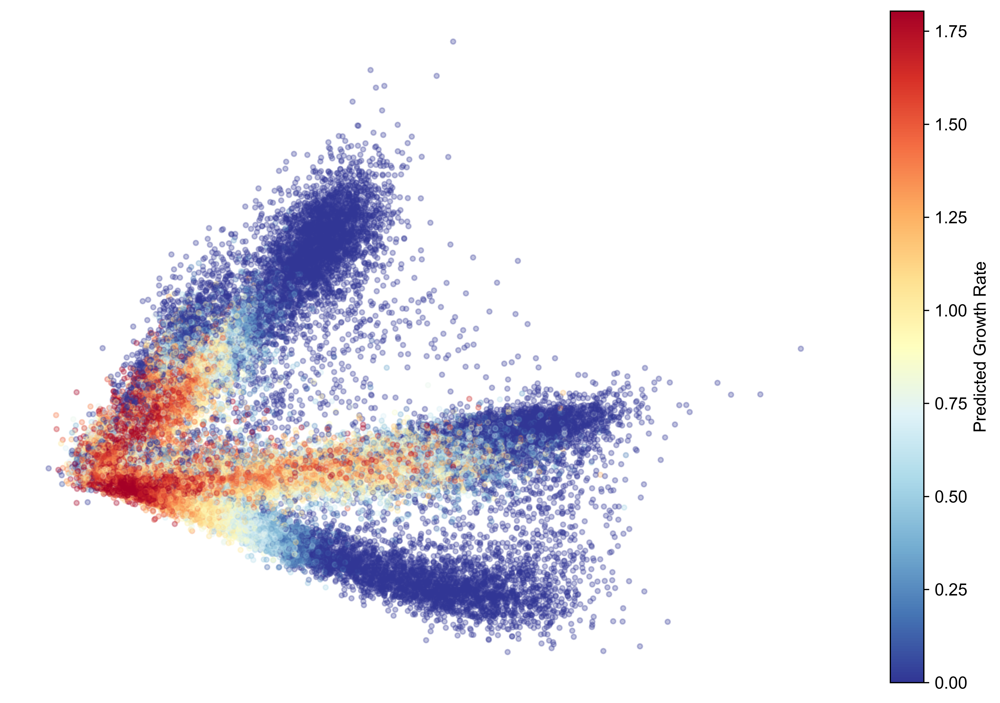

In [11]:

CytoBridge.pl.plot_growth(adata, dim_reduction = 'none', save_path = 'g_values_plot.svg')

Reconstructing model...
Model loaded successfully.
Reconstructing model...
Model loaded successfully.


computing velocity graph (using 16/64 cores)


  0%|          | 0/49302 [00:00<?, ?cells/s]

    finished (0:00:19) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:07) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file /home/sjt/workspace2/CytoBridge_test-main_crufm/figures/scvelo_Velocity_Stream_Plot.svg


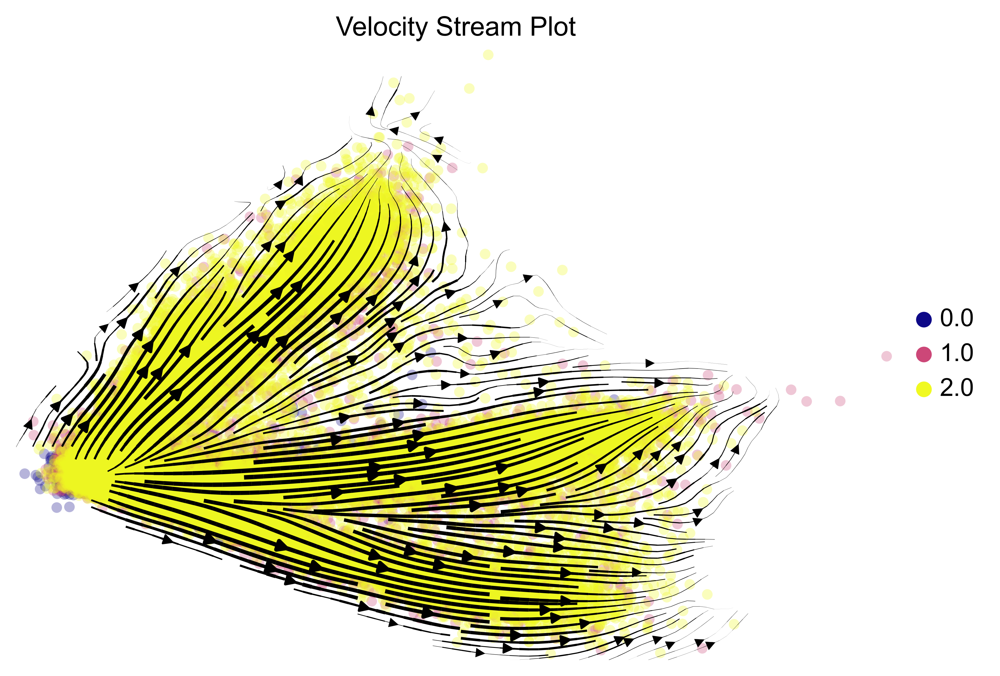

Velocity stream plot saved to: /home/sjt/workspace2/CytoBridge_test-main_crufm/figures/Velocity_Stream_Plot.svg
Reconstructing model...
Model loaded successfully.
saving figure to file /home/sjt/workspace2/CytoBridge_test-main_crufm/figures/scvelo_Score_Stream_Plot.svg


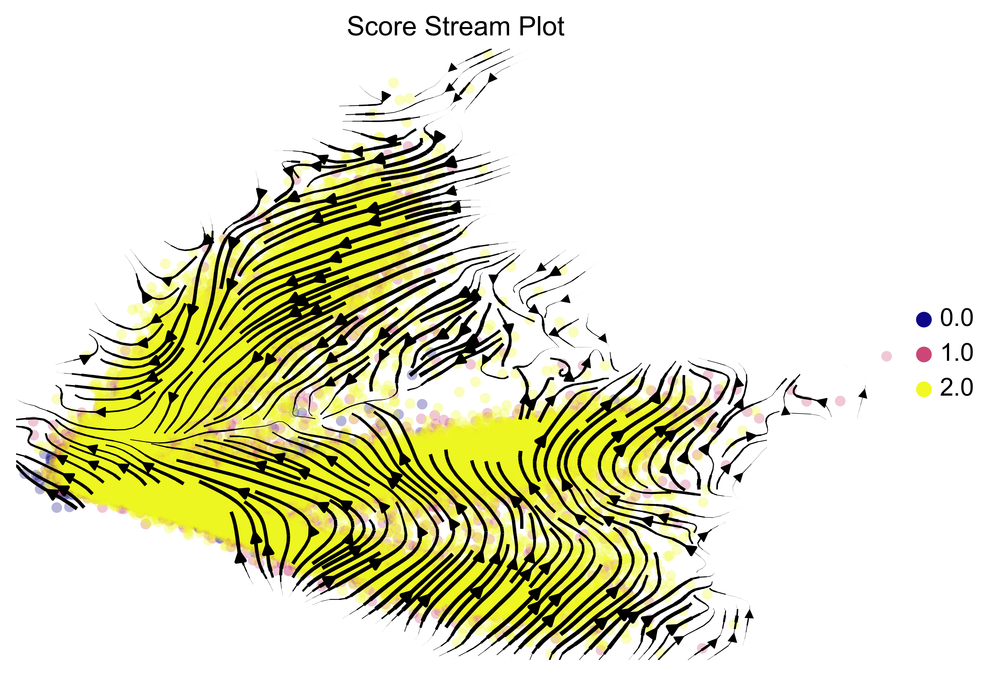

Score function diffusion velocity stream plot saved to: /home/sjt/workspace2/CytoBridge_test-main_crufm/figures/Score_Stream_Plot.svg
Reconstructing model...
Model loaded successfully.
computing velocity graph (using 16/64 cores)


  0%|          | 0/49302 [00:00<?, ?cells/s]

    finished (0:00:17) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:07) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file /home/sjt/workspace2/CytoBridge_test-main_crufm/figures/scvelo_All_Velocity_Stream.svg


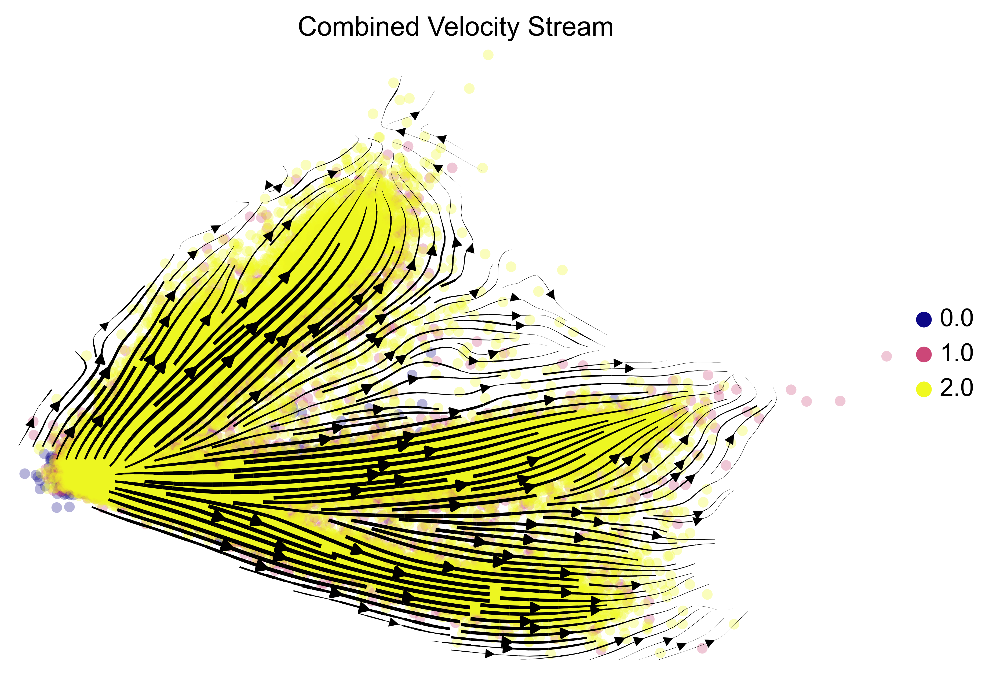

Combined velocity stream plot saved to: /home/sjt/workspace2/CytoBridge_test-main_crufm/figures/All_Velocity_Stream.svg


In [10]:
exp_fig_dir  = "/home/sjt/workspace2/CytoBridge_test-main_crufm/figures"
import CytoBridge
model  = CytoBridge.utils.load_model_from_adata(adata)

if 'velocity_latent' in adata.obsm:
    CytoBridge.pl.plot_velocity_stream(adata, exp_fig_dir, dim_reduction='none', device='cuda')
if 'score_latent' in adata.obsm:
    CytoBridge.pl.plot_score_stream(adata, exp_fig_dir, dim_reduction='none', device='cuda')
if 'score_latent' and 'velocity_latent' in adata.obsm:
    CytoBridge.pl.plot_combined_velocity_stream(adata,exp_fig_dir,dim_reduction='none',device='cuda')

In [ ]:
CytoBridge.pl.plot_ode_trajectories(
    adata=adata,
    save_dir=exp_fig_dir,
    n_trajectories=20,
    n_bins=10,
    dim_reduction='none',
    device=device
)


In [ ]:
adata = CytoBridge.pl.plot_sde_trajectories(
    adata=adata,
    exp_dir=os.path.join(exp_fig_dir, "sde_results"),  
    device=device,
    sigma=0.05,
    n_time_steps=10,
    sample_traj_num=10,
    sample_cell_tra_consistent = True,
)


In [ ]:
#only for 2-dimension
for t in [0, 1, 2, 3, 4]:
    CytoBridge.pl.plot_score_and_gradient(
        dynamical_model=model,
        device=device,
        t_value=t,
        x_range=(0, 2.5),
        y_range=(0, 2.5),
        save_path=os.path.join(exp_fig_dir, f"{t}_density.pdf"),
        cmap='rainbow'
    )